# Income Prediction
## Sivan Salzmann 207056334

## Intro

## Objective of the porject
The goal of this machine learning project is **to predict whether a person makes over 50K a year or not** given their demographic variation.

## Data Dictionary
1. **Categorical Attributes**

- **workclass:** (categorical) Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, State-gov, Without-pay, Never-worked.
- **education:** (categorical) Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool
- **marital-status:** (categorical) Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse.
- **occupation:** (categorical) Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing,         Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces.
- **relationship:** (categorical) Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried.
Individual's relation in a family
- **sex:** (categorical) Female, Male.
- **native-country:** (categorical) United-States, Cambodia, England, Puerto-Rico, Canada, Germany, Outlying-US(Guam-USVI-etc), India, Japan, Greece, South, China, Cuba, Iran, Honduras, Philippines, Italy, Poland, Jamaica, Vietnam, Mexico, Portugal, Ireland, France, Dominican-Republic, Laos, Ecuador, Taiwan, Haiti, Columbia, Hungary, Guatemala, Nicaragua, Scotland, Thailand, Yugoslavia, El-Salvador, Trinadad&Tobago, Peru, Hong, Holand-Netherlands.
- **Income:** (categorical). The target value: <=50K or >50K

2.**Continuous Attributes**
- **age:** continuous.
- **fnlwgt:** continuous - estimated number of people this row represents.
- **capital-gain:** continuous.
- **capital-loss:** continuous.
- **hours-per-week:** continuous.

### Importing Libraries

In [1]:
#dataframe
import pandas as pd
import numpy as np

#visualization
import matplotlib.pyplot as plt
import seaborn as sns

#for alghoritms
from sklearn.naive_bayes import GaussianNB
import datetime
from pandas.api.types import is_numeric_dtype
import sklearn as skl
from scipy.stats import skewnorm
import scipy.stats as stats
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation
import pydotplus
from matplotlib import ticker

In [2]:
df = pd.read_csv('income1.csv')

In [3]:
#checking the imported datafile
df.head()

,Index,age,workclass,fnlwgt,education,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,0,39.0,State-gov,77516,Bachelors,Never-married,Adm-clerical,Not-in-family,White,Male,2174.0,0.0,40,United-States,<=50K
1,1,50.0,Self-emp-not-inc,83311,NaN,Married-civ-spouse,Exec-managerial,Husband,White,Male,0.0,0.0,13,United-States,<=50K
2,2,38.0,Private,215646,HS-grad,Divorced,Handlers-cleaners,Not-in-family,White,Male,0.0,0.0,40,United-States,<=50K
3,3,53.0,Private,234721,11th,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0.0,0.0,40,United-States,<=50K
4,4,28.0,Private,338409,Bachelors,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0.0,0.0,40,Cuba,<=50K


In [4]:
#Determining dimensionality of dataframe
df.shape

(32561, 15)

As we can see, there are 32561 rows (records) and 14 columns in our dataset.

In [5]:
#Listing Dataframe columns
df.columns

Index(['Index', 'age', 'workclass', 'fnlwgt', 'education', 'marital-status',
       'occupation', 'relationship', 'race', 'sex', 'capital-gain',
       'capital-loss', 'hours-per-week', 'native-country', 'income'],
      dtype='object')

Above are the list of column names in our dataset.

In [6]:
#Descriptive Analytics of quantitative variables in the dataframe
df.describe()

,Index,age,fnlwgt,capital-gain,capital-loss,hours-per-week
count,32561.000000,31819.000000,3.256100e+04,29372.000000,28352.000000,32561.000000
mean,16280.000000,38.577108,1.896806e+05,1068.434121,88.036788,40.437456
std,9399.695394,13.624013,1.056631e+05,7355.105564,404.938281,12.347429
min,0.000000,17.000000,-5.417700e+04,0.000000,0.000000,1.000000
25%,8140.000000,28.000000,1.177890e+05,0.000000,0.000000,40.000000
50%,16280.000000,37.000000,1.783410e+05,0.000000,0.000000,40.000000
75%,24420.000000,48.000000,2.369940e+05,0.000000,0.000000,45.000000
max,32560.000000,90.000000,1.484705e+06,99999.000000,4356.000000,99.000000


In [7]:
#Determining dataframe columns characteristics
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Index           32561 non-null  int64  
 1   age             31819 non-null  float64
 2   workclass       32561 non-null  object 
 3   fnlwgt          32561 non-null  int64  
 4   education       28273 non-null  object 
 5   marital-status  31883 non-null  object 
 6   occupation      29367 non-null  object 
 7   relationship    32561 non-null  object 
 8   race            30754 non-null  object 
 9   sex             26090 non-null  object 
 10  capital-gain    29372 non-null  float64
 11  capital-loss    28352 non-null  float64
 12  hours-per-week  32561 non-null  int64  
 13  native-country  32561 non-null  object 
 14  income          32561 non-null  object 
dtypes: float64(3), int64(3), object(9)
memory usage: 3.7+ MB


In [8]:
#Listing datatypes of the columns
df.dtypes

Index               int64
age               float64
workclass          object
fnlwgt              int64
education          object
marital-status     object
occupation         object
relationship       object
race               object
sex                object
capital-gain      float64
capital-loss      float64
hours-per-week      int64
native-country     object
income             object
dtype: object

## Intial Data Analysis

### Clean and manipulation data

Since the Index number is not important, let's remove its column.

In [9]:
df.drop(['Index'], axis=1, inplace=True)

Our column names also include '-' which is not recognised by pandas and gives error while calling it. Therefore, we will replaced '-' with '_' as shown above.

In [10]:
#Removing spaces infront of the column names
stripped_columns = []
for item in list(df.columns):
    item = item.strip()
    stripped_columns.append(item)
#Replacing column names with stripped_columns
df.columns = stripped_columns
#Checking new column names
df.columns

Index(['age', 'workclass', 'fnlwgt', 'education', 'marital-status',
       'occupation', 'relationship', 'race', 'sex', 'capital-gain',
       'capital-loss', 'hours-per-week', 'native-country', 'income'],
      dtype='object')

All our initial column names included " " (space) before their names. Therefore, to make it easier to call columns, we removed the spaces before the column names.

In [11]:
#Using '_' to replace the column names
columns= list(df.columns)
adder = ""
new_columns =[]
for each_column in columns:
    for letter in each_column:
        if letter=="-":
            adder = adder + "_"
        else:
            adder = adder + letter
    new_columns.append(adder)
    adder=""
new_columns

['age',
 'workclass',
 'fnlwgt',
 'education',
 'marital_status',
 'occupation',
 'relationship',
 'race',
 'sex',
 'capital_gain',
 'capital_loss',
 'hours_per_week',
 'native_country',
 'income']

The above table shows descriptive statistics for numerical variables in our dataset.

In [12]:
#replacing old columns with new column names
df.columns=new_columns

In [13]:
#Checking if any cells has missing values
df.isnull().sum()

age                742
workclass            0
fnlwgt               0
education         4288
marital_status     678
occupation        3194
relationship         0
race              1807
sex               6471
capital_gain      3189
capital_loss      4209
hours_per_week       0
native_country       0
income               0
dtype: int64

Above code checks whether there are any empty/blank cells in the dataset. As we can see, there are alot of empty values:

1. age             
2. workclass       
3. education       
4. marital-status
5. occupation
6. race            
7. sex
8. capitel-gain
9. capitel-loss
10. native-country

In [14]:
#Determining different attributes for categorical variables
categorical_var = list(df.select_dtypes(include=object).columns)
for item in categorical_var:
    print(item + ":")
    print(df[item].unique())

workclass:
[' State-gov' ' Self-emp-not-inc' ' Private' ' Federal-gov' ' Local-gov'
 ' ?' ' Self-emp-inc' ' Without-pay' ' Never-worked']
education:
[' Bachelors' nan ' HS-grad' ' 11th' ' Masters' ' 9th' ' Some-college'
 ' Assoc-acdm' ' Assoc-voc' ' 7th-8th' ' 5th-6th' ' Doctorate' ' 10th'
 ' Prof-school' ' 1st-4th' ' Preschool' ' 12th']
marital_status:
[' Never-married' ' Married-civ-spouse' ' Divorced'
 ' Married-spouse-absent' ' Separated' ' Married-AF-spouse' nan ' Widowed']
occupation:
[' Adm-clerical' ' Exec-managerial' ' Handlers-cleaners' ' Prof-specialty'
 ' Other-service' ' Sales' ' Craft-repair' ' Transport-moving'
 ' Farming-fishing' ' Machine-op-inspct' nan ' Tech-support' ' ?'
 ' Protective-serv' ' Armed-Forces' ' Priv-house-serv']
relationship:
[' Not-in-family' ' Husband' ' Wife' ' Own-child' ' Unmarried'
 ' Other-relative']
race:
[' White' ' Black' ' Asian-Pac-Islander' ' Amer-Indian-Eskimo' nan
 ' Other']
sex:
[' Male' ' Female' nan]
native_country:
[' United-States' 

In [15]:
#replacing '?' with Unknown:
df['workclass'].replace(' ?', ' Unknown',inplace=True)
df['occupation'].replace(' ?', ' Unknown',inplace=True)
df['native_country'].replace(' ?', ' Unknown',inplace=True)

In [16]:
#Dropping Numerical Variables with Zero Variance
df.std()

age                   13.624013
fnlwgt            105663.104960
capital_gain        7355.105564
capital_loss         404.938281
hours_per_week        12.347429
dtype: float64

In [17]:
#Dropping Categorical Variables with zero variation
categorical_var = list(df.select_dtypes(include=object).columns)
zero_cardinality = []
for column in categorical_var:
    if len(df[column].value_counts().index)==1:
        zero_cardinality.append(column)
zero_cardinality

[]

In [18]:
#Dropping Categorical Variables with Multiple Levels:
high_cardinality = []
for column in categorical_var:
    if len(df[column].value_counts().index)>100:
        high_cardinality.append(column)
high_cardinality

[]

We will delete rows if income that not include income

In [19]:
print("Removing {} rows".format(len(df[df['income'] == np.nan])))
df.dropna(subset=['income'],axis=0,inplace=True)

Removing 0 rows


We will remove unconsistent rows:

1. hours-per-week > 50
2. age > 100
3. fnlwgt < 0 

In [20]:
print("Removing {} rows".format(len(df[df['hours_per_week'] > 50])))
print("Removing {} rows".format(len(df[df['age'] > 100])))
print("Removing {} rows".format(len(df[df['fnlwgt'] <= 0])))

df[df['hours_per_week'] <= 50]
df[df['age'] <= 100]
df[df['fnlwgt'] >= 0]

Removing 3643 rows
Removing 0 rows
Removing 16 rows


,age,workclass,fnlwgt,education,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
0,39.0,State-gov,77516,Bachelors,Never-married,Adm-clerical,Not-in-family,White,Male,2174.0,0.0,40,United-States,<=50K
1,50.0,Self-emp-not-inc,83311,NaN,Married-civ-spouse,Exec-managerial,Husband,White,Male,0.0,0.0,13,United-States,<=50K
2,38.0,Private,215646,HS-grad,Divorced,Handlers-cleaners,Not-in-family,White,Male,0.0,0.0,40,United-States,<=50K
3,53.0,Private,234721,11th,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0.0,0.0,40,United-States,<=50K
4,28.0,Private,338409,Bachelors,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0.0,0.0,40,Cuba,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,27.0,Private,257302,NaN,Married-civ-spouse,NaN,Wife,White,Female,0.0,0.0,38,United-States,<=50K
32557,40.0,Private,154374,HS-grad,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,NaN,0.0,40,United-States,>50K
32558,58.0,Private,151910,HS-grad,Widowed,NaN,Unmarried,White,Female,0.0,0.0,40,United-States,<=50K
32559,22.0,Private,201490,HS-grad,Never-married,Adm-clerical,Own-child,White,Male,0.0,0.0,20,United-States,<=50K


check if there 2 NA values in row, drop it

In [21]:
df.dropna(thresh=2)

,age,workclass,fnlwgt,education,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
0,39.0,State-gov,77516,Bachelors,Never-married,Adm-clerical,Not-in-family,White,Male,2174.0,0.0,40,United-States,<=50K
1,50.0,Self-emp-not-inc,83311,NaN,Married-civ-spouse,Exec-managerial,Husband,White,Male,0.0,0.0,13,United-States,<=50K
2,38.0,Private,215646,HS-grad,Divorced,Handlers-cleaners,Not-in-family,White,Male,0.0,0.0,40,United-States,<=50K
3,53.0,Private,234721,11th,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0.0,0.0,40,United-States,<=50K
4,28.0,Private,338409,Bachelors,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0.0,0.0,40,Cuba,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,27.0,Private,257302,NaN,Married-civ-spouse,NaN,Wife,White,Female,0.0,0.0,38,United-States,<=50K
32557,40.0,Private,154374,HS-grad,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,NaN,0.0,40,United-States,>50K
32558,58.0,Private,151910,HS-grad,Widowed,NaN,Unmarried,White,Female,0.0,0.0,40,United-States,<=50K
32559,22.0,Private,201490,HS-grad,Never-married,Adm-clerical,Own-child,White,Male,0.0,0.0,20,United-States,<=50K


We will fill the rest NA values with mode for categorical and mean for nummary

In [22]:
df['capital_gain'].fillna(round((df['capital_gain'].mean()), 2), inplace=True)
df['capital_loss'].fillna(round((df['capital_loss'].mean()), 2), inplace=True)
df['age'].fillna(round((df['age'].mean()), 2), inplace=True)
df['sex'].fillna((df['sex'].mode()[0]), inplace=True)
df['education'].fillna((df['education'].mode()[0]), inplace=True)
df['occupation'].fillna((df['occupation'].mode()[0]), inplace=True)
df['marital_status'].fillna((df['marital_status'].mode()[0]), inplace=True)
df['race'].fillna((df['race'].mode()[0]), inplace=True)

In [23]:
df.isnull().sum()

age               0
workclass         0
fnlwgt            0
education         0
marital_status    0
occupation        0
relationship      0
race              0
sex               0
capital_gain      0
capital_loss      0
hours_per_week    0
native_country    0
income            0
dtype: int64

I will change Numeric to Categorical Using Dummies. I wull do it to the binary coulmn:

 1. sex

In [24]:
df = pd.concat([df, pd.get_dummies(df['sex'], prefix='sex')], axis=1)

I will add new coulmn capital_diff that will be capital_gain-capital_loss

In [25]:
df['capital_diff'] = df['capital_gain']-df['capital_loss']

In [26]:
df.to_csv("clear_df.csv", index=False)

### Statistical analysis

This shows different categories for each column. We can see that occupation column, workclass and native_country column consists of ?, which is a missing/unknown value. So, we will replace them with another separate attribute known as Unknown.

In [27]:
#calculating mode for categorical variables:
def mode(list_of_nums):
    average = list_of_nums.mode()
    return average

categorical_var = list(df.select_dtypes(include=object).columns)

#printing mode of categorical variables
for item in categorical_var:
    print(item + " mode: "+ mode(df[item]))
    

0    workclass mode:  Private
dtype: object
0    education mode:  HS-grad
dtype: object
0    marital_status mode:  Married-civ-spouse
dtype: object
0    occupation mode:  Prof-specialty
dtype: object
0    relationship mode:  Husband
dtype: object
0    race mode:  White
dtype: object
0    sex mode:  Male
dtype: object
0    native_country mode:  United-States
dtype: object
0    income mode:  <=50K
dtype: object


Above result shows the mode of each categorical columns in the dataset.

## Explority Data Analysis

### a. Categorical Variables

In [28]:
#list of numberical and categorical variables
categorical_var = list(df.select_dtypes(include=object).columns)
numerical_var = list(df.select_dtypes(exclude=object).columns)

Text(0.5, 0, '\nWorkclass Types')

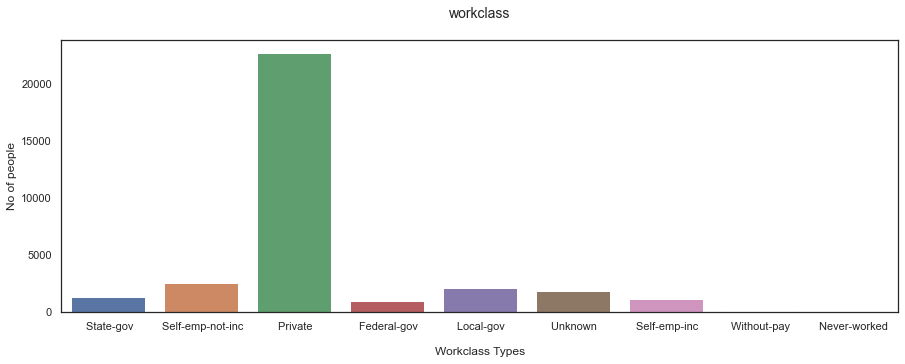

In [29]:
#Creating bargraph for workclass
plt.figure(figsize=(15,5))
sns.set(style = 'white')
sns.countplot(x="workclass", data=df)
plt.title("workclass\n",size =14)
plt.ylabel("No of people")
plt.xlabel("\nWorkclass Types")

The above bargraph shows that most of the people are in private occupaction followed by self-employed, local-gov, and state-gov.

Text(0.5, 0, '\n Education Level')

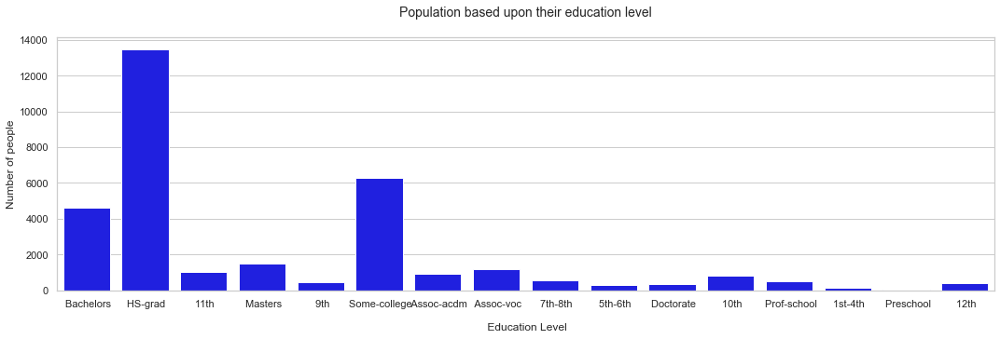

In [30]:
#Bargraph representing number of people with different education level
plt.figure(figsize=(18,5))
sns.set(style = 'whitegrid')
sns.countplot(x="education", data=df,color='blue')
plt.title("Population based upon their education level\n",size=14)
plt.ylabel("Number of people")
plt.xlabel("\n Education Level")

The above bar graph shows that most people in the dataset are highschool graduates followed by some college, and Bachelors degree.

C:\Users\sivan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='education', ylabel='count'>

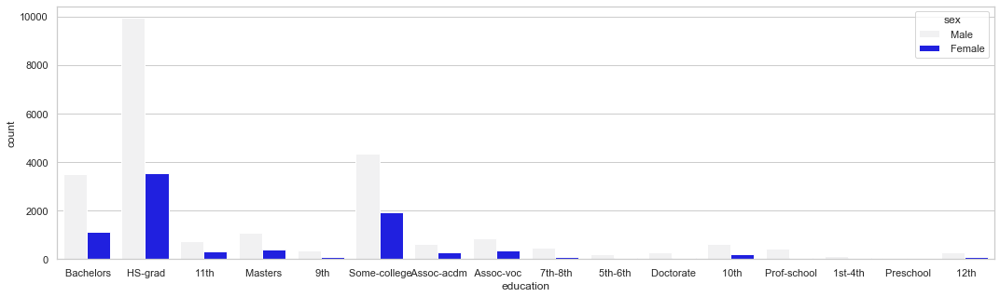

In [31]:
#Graph representing number of people based upon eduacation and sex
plt.figure(figsize=(18,5))
sns.countplot("education",data=df,hue="sex",color="blue")

This graph shows the education level of people along with their sex. We can clearly make a distinction that the dataset contains more male recods than female.

C:\Users\sivan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='marital_status', ylabel='count'>

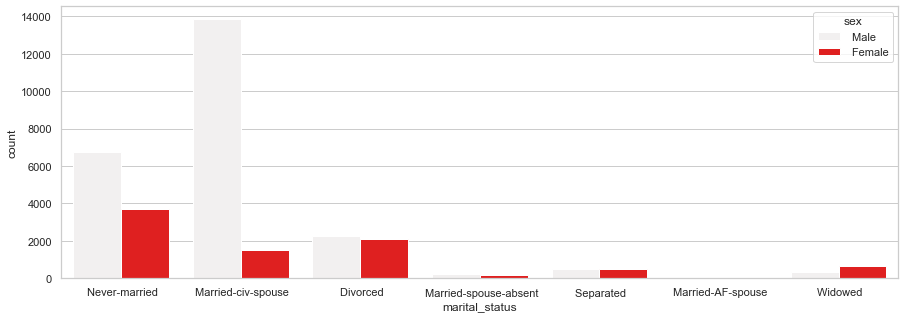

In [32]:
#Graph representing marital_status of people in the dataset:
plt.figure(figsize=(15,5))
sns.countplot("marital_status",data=df,hue="sex",color="red")

Most of the working people are married followed by single people. But in case of female, most of the working females are single followed by divorced and married.

C:\Users\sivan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='income', ylabel='count'>

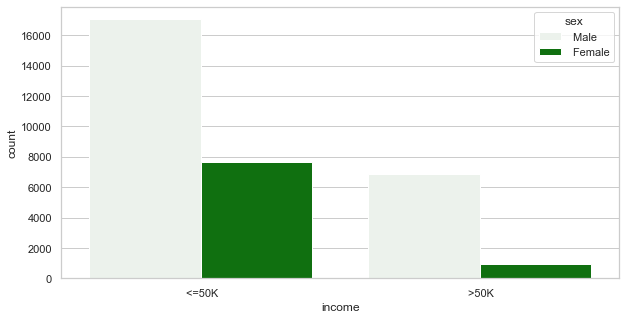

In [33]:
#Graph representing number of people based upon income:
plt.figure(figsize=(10,5))
sns.countplot("income",data=df,hue="sex",color="green")

Majority of people have income less than or equal to $50,000 as shown by the graph above 

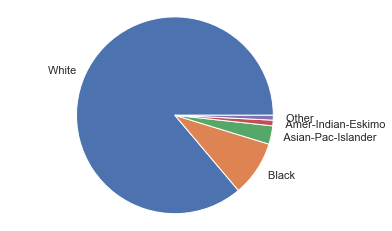

In [34]:
#Piechart showing representation of race in dataset
fig1, ax1 = plt.subplots()
X = list(df['race'].value_counts().index)
Y = list(df['race'].value_counts().values)
ax1.pie(Y,labels=X)
ax1.axis('equal') 
plt.show()

The above piechart shows that most of the records in our dataset belong to white population followed by black, pacific islanders, American-Indian eskimo, and others.

### b. Quantitative Variables

I will plot correlation map between all the numrical vriables

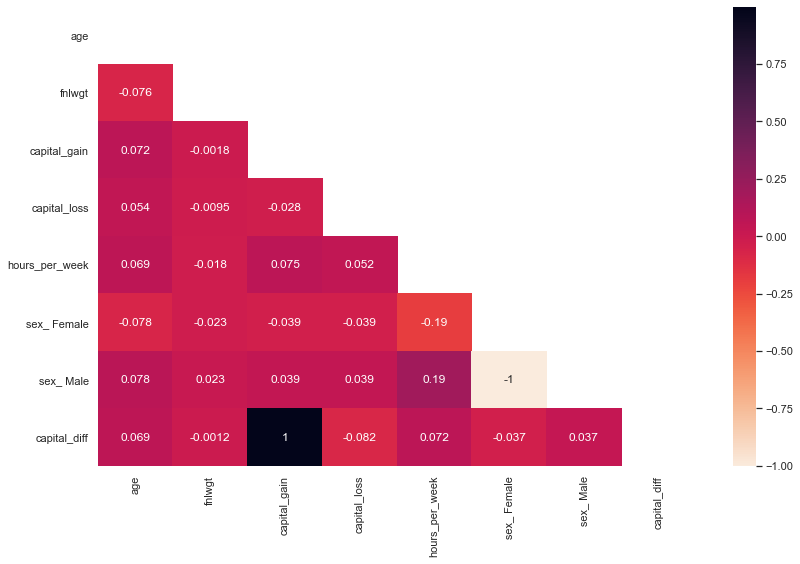

In [35]:
numerical_df = df.select_dtypes(exclude=['object'])
plt.figure(figsize=(12, 8))
color_map = plt.cm.get_cmap('rocket')
reversed_color_map = color_map.reversed()
matrix = np.triu(numerical_df.corr())
sns.heatmap(numerical_df.corr(), annot=True, mask=matrix, cmap=reversed_color_map)
plt.tight_layout()
plt.show()

C:\Users\sivan\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Age Histogram')

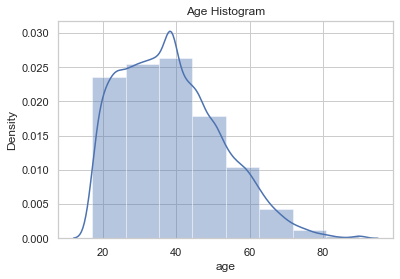

In [36]:
#Histogram representing age
sns.distplot(df['age'],bins=8)
plt.title("Age Histogram")

From above histogram, we can see that most of the people belong to the age group of 20-40 years and age group above 80 has the least number of people.

Text(0.5, 1.0, 'Box plot representing age and income \n')

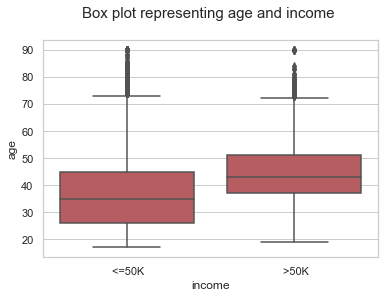

In [37]:
#Variation between age and income level
sns.boxplot(x=df['income'],y=df['age'],color='r')
plt.title("Box plot representing age and income \n", size = 15)

Boxplot can be used to accuratly measure the variation between the variables. As we can see, the median age of people earning less than 50,000 is around 34 years and that of people earling more than 50,000 is around 45 years. 

Text(0.5, 1.0, 'Box plot representing age and income \n')

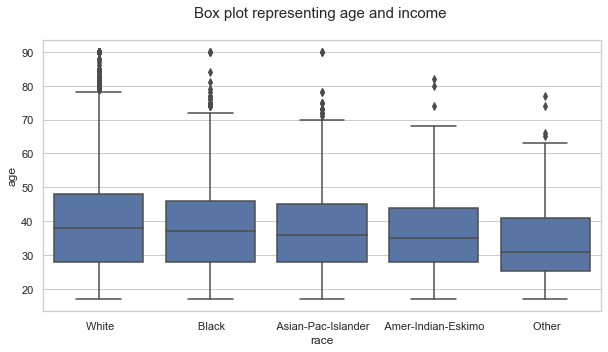

In [38]:
#Variation between race and age
plt.figure(figsize=(10,5))
sns.boxplot(x=df['race'],y=df['age'],color='b')
plt.title("Box plot representing age and income \n", size = 15)

There is not much difference in age of working population among different races. 

Text(0.5, 1.0, 'Box plot representing age and income \n')

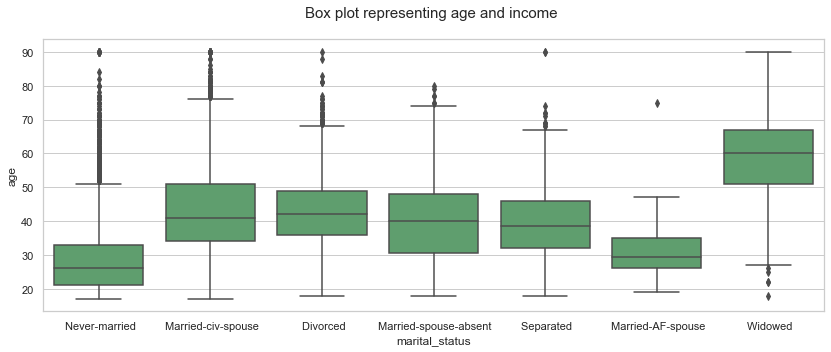

In [39]:
#Variation between marital status and age
plt.figure(figsize=(14,5))
sns.boxplot(x=df['marital_status'],y=df['age'],color='g')
plt.title("Box plot representing age and income \n", size = 15)

Majority of younger people are single. The median age of single people is 25 and that of married and divorced are 42 and 42 respectively. We can also see that most of the widowed female belonged to the age group between 50 to 70 with 60 being the median age.

Text(0.5, 1.0, 'Relationship between hours worked and age')

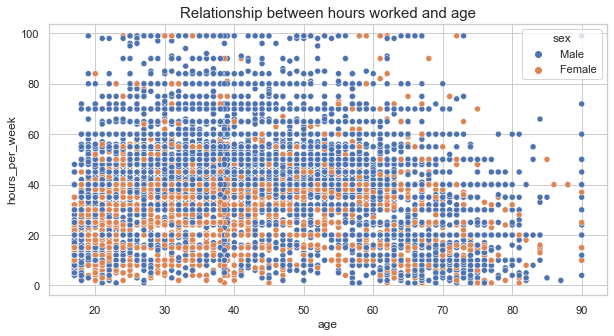

In [40]:
#Scatterplot representing relationship between age and hours-per-week
plt.figure(figsize=(10,5))
sns.scatterplot(x="age",y="hours_per_week",hue="sex",data=df)
plt.title('Relationship between hours worked and age',size=15)

From above scatterplot, we can see that there is no definite relationship between age and hours they work, both in case of male and female. However, we can see that male tends to work more hours per week than that of female.

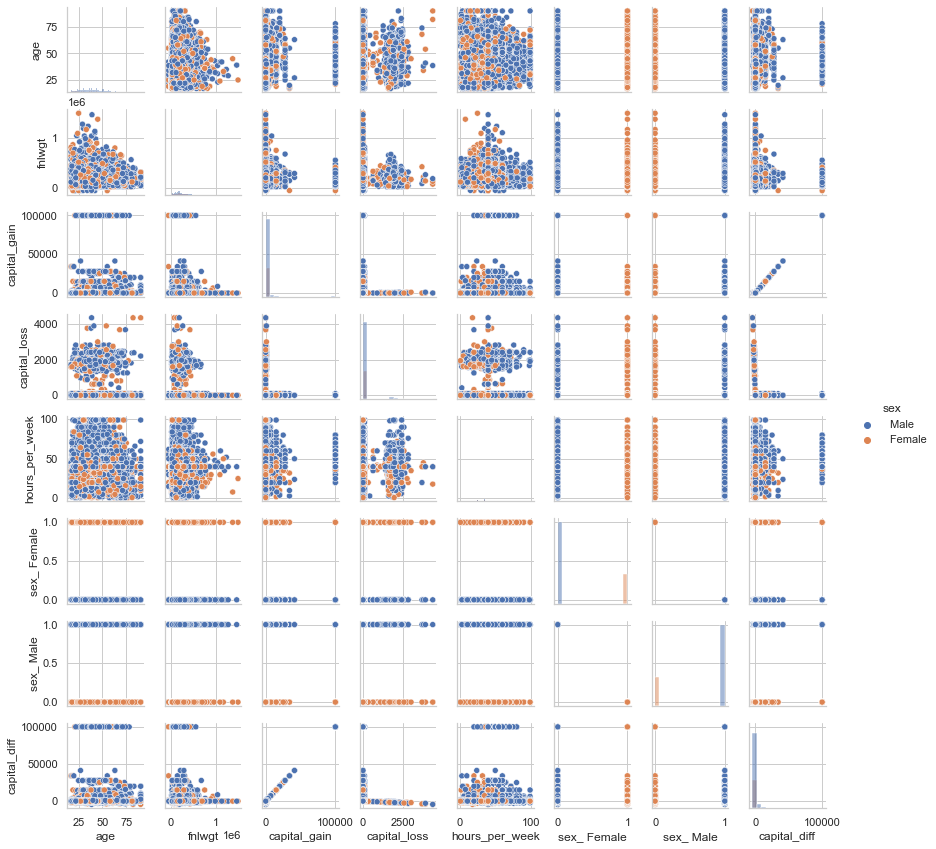

In [41]:
# #pairplot to determine relationship between all the quantitative variables
sns.pairplot(df,height =1.5, hue="sex", diag_kind="hist")


The above graph shows the relationship between the quantitative variables. From above scatterplots, we can see that there is not definite correlation between the numrical variables.

### Encoding Categorical variables

In [42]:
values_workclass = [' Private',' Self-emp-not-inc',' Self-emp-inc',' Federal-gov',' Local-gov',' State-gov',' Without-pay',' Never-worked',' Unknown']
df['workclass_encoding'] = pd.Categorical(df.workclass ,categories=values_workclass ).codes + 1
values_education = [' Bachelors',' Some-college',' 11th',' HS-grad',' Prof-school',' Assoc-acdm',' Assoc-voc',' 9th',' 7th-8th',' 12th',
                    ' Masters',' 1st-4th',' 10th',' Doctorate',' 5th-6th',' Preschool','Unknown']
df['education_encoding'] = pd.Categorical(df.education,categories=values_education).codes + 1
values_marital= [' Married-civ-spouse',' Divorced',' Never-married',' Separated',' Widowed',' Married-spouse-absent',' Married-AF-spouse',' Unknown']
df['marital_status_encoding'] = pd.Categorical(df['marital_status'], categories=values_marital).codes + 1
values_occupation = [' Tech-support',' Craft-repair',' Other-service',' Sales',' Exec-managerial',' Prof-specialty','  Handlers-cleaners']
df['occupation_encoding'] = pd.Categorical(df.occupation,categories=values_occupation).codes + 1
values_race = [' White',' Asian-Pac-Islander',' Amer-Indian-Eskimo', 'Other',' Black' ]
df['race_encoding'] = pd.Categorical(df.race,categories=values_race).codes + 1
values_relationship= [' Wife',' Own-child',' Husband',' Not-in-family',' Other-relative',' Unmarried']
df['relationship_encoding'] = pd.Categorical(df.relationship,categories=values_relationship).codes + 1
values_native= [' United-States',' Cambodia',' England',' Puerto-Rico',' Canada',' Germany',' Outlying-US(Guam-USVI-etc)',' India',' Japan',' Greece',' South',' China',' Cuba',
                ' Iran','Honduras',' Philippines',' Italy',' Poland',' Jamaica',' Vietnam',' Mexico','Portugal',' Ireland',' France',' Dominican-Republic','Laos','Ecuador',
                ' Taiwan',' Haiti',' Columbia',' Hungary',' Guatemala',' Nicaragua',' Scotland',' Thailand',' Yugoslavia',' El-Salvador',' Trinadad&Tobago',' Peru',' Hong',' Holand-Netherlands']
df['native_country_encoding'] = pd.Categorical(df['native_country'],categories=values_native).codes + 1


In [43]:
values_income = [' <=50K',' >50K']
df['income'] = pd.Categorical(df.income, categories=values_income).codes + 1

Now, the income greater than 50K is encoded by 1, and income less than or equal to 50K is encoded by 0.

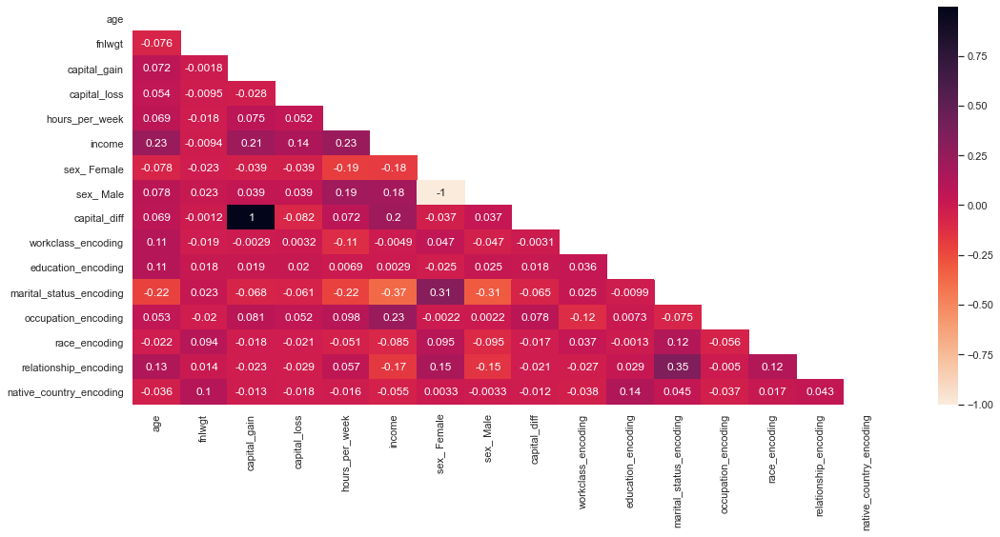

In [44]:
numerical_df = df.select_dtypes(exclude=['object'])
plt.figure(figsize=(16, 8))
color_map = plt.cm.get_cmap('rocket')
reversed_color_map = color_map.reversed()
matrix = np.triu(numerical_df.corr())
sns.heatmap(numerical_df.corr(), annot=True, mask=matrix, cmap=reversed_color_map)
plt.tight_layout()
plt.show()

**Heat Map Conclusions**

1. Correlation between income and age
2. Correlation between income and matrial_status
3. Correlation between income and capital_gain
4. Correlation between education and native_country
5. Correlation between income and hours_per_week
6. Correlation between matrial_stutus and relationship

In the following cells, I plot each of them.

In [45]:
df['age-bin'] = pd.cut(df['age'], bins = [0, 25, 50, 90], labels = ['Young', 'Adult', 'Old'])

<AxesSubplot:xlabel='count', ylabel='age-bin'>

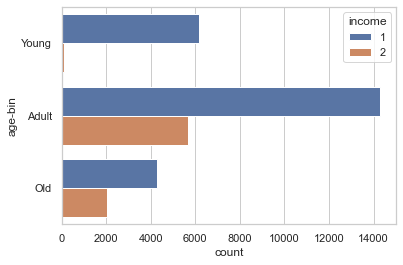

In [46]:
sns.countplot(y = 'age-bin', hue = 'income', data = df)

<AxesSubplot:xlabel='count', ylabel='marital_status_encoding'>

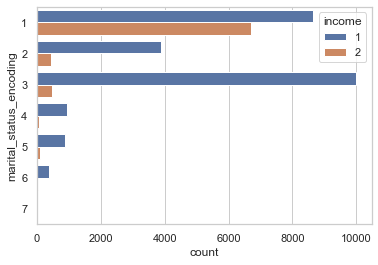

In [47]:
sns.countplot(y = 'marital_status_encoding', hue = 'income', data = df)

In [48]:
df['capital_gain-bin'] = pd.cut(df['capital_gain'], bins = [-5000, 5000, 100000], labels = ['Minor', 'Major'])

<AxesSubplot:xlabel='count', ylabel='capital_gain-bin'>

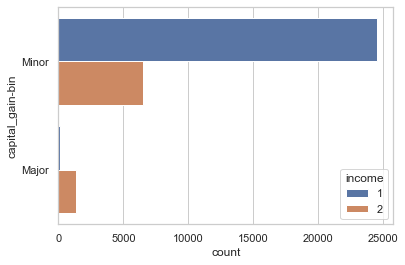

In [49]:
sns.countplot(y = 'capital_gain-bin', hue = 'income', data = df)

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

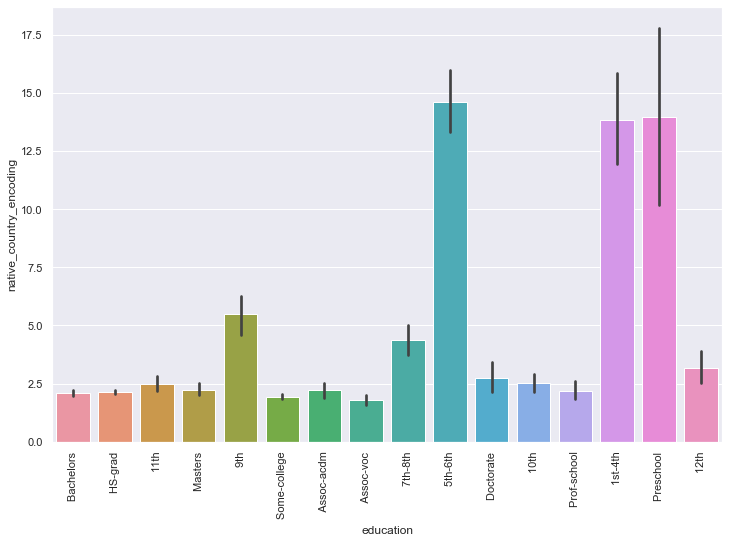

In [50]:
sns.set(rc={'figure.figsize':(12,8)})
sns_grad = sns.barplot(x = df['education'], y = df['native_country_encoding'], data = df)
plt.setp(sns_grad.get_xticklabels(), rotation=90)

In [51]:
df['hours_per_week_bin'] = pd.cut(df['hours_per_week'], 
                                   bins = [0, 30, 40, 100], 
                                   labels = ['Lesser Hours', 'Normal Hours', 'Extra Hours'])

<AxesSubplot:xlabel='hours_per_week_bin', ylabel='count'>

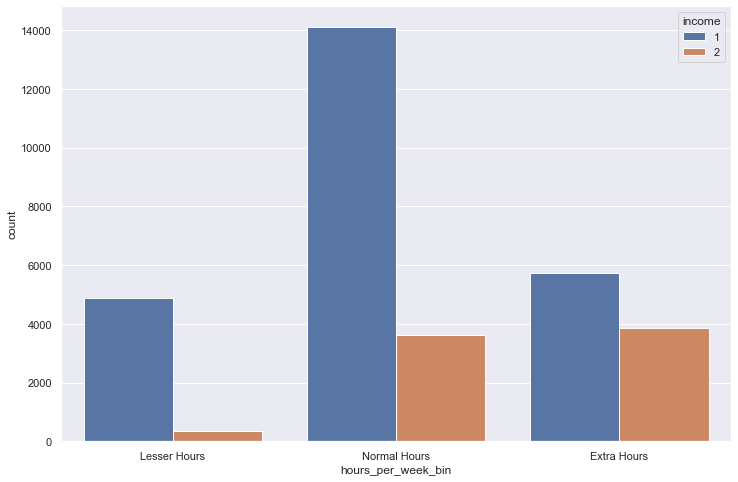

In [52]:
sns.countplot(x = 'hours_per_week_bin', hue = 'income', data = df)

<AxesSubplot:xlabel='marital_status', ylabel='count'>

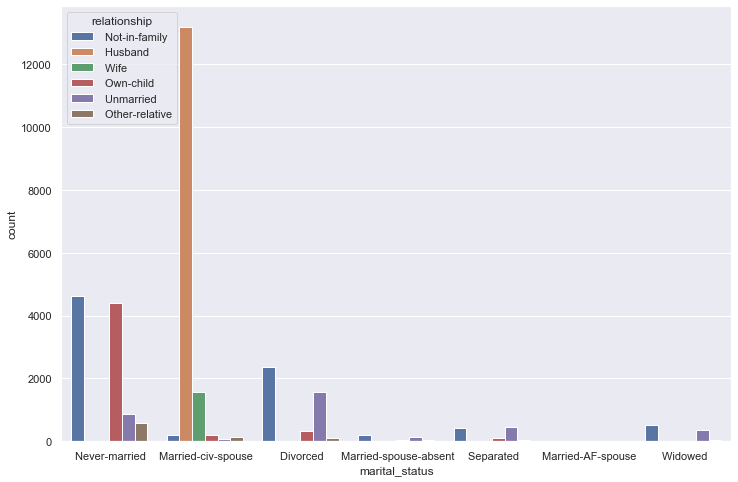

In [53]:
sns.countplot(x = 'marital_status', hue = 'relationship', data = df)

## Classification Model

### Gussian Naive Bayes

In [54]:
def check_accuracy(items):
    X = df[items]
    Y = df['income']
    Xtrain, Xtest, ytrain, ytest = train_test_split(X, Y, test_size=0.2,
                                                    random_state=1)

    model = GaussianNB()                       # 2. instantiate model
    model.fit(Xtrain, ytrain)                  # 3. fit model to data
    y_model = model.predict(Xtest)             # 4. predict on new data (output is numpy array)

    ypred = pd.Series(y_model,name="prediction")
    predicted = pd.concat([Xtest.reset_index(),ytest.reset_index(),ypred],axis=1)
    accuracy = metrics.accuracy_score(ytest, y_model)
    print("{} vs {} accuracy: ".format(items[0], items[1]), accuracy)

check_accuracy(['sex_ Female', 'marital_status_encoding'])
check_accuracy(['hours_per_week', 'age'])
check_accuracy(['capital_gain', 'age'])

sex_ Female vs marital_status_encoding accuracy:  0.7035160448334101
hours_per_week vs age accuracy:  0.771994472593275
capital_gain vs age accuracy:  0.7968678028558268


Let's select the 2 features that yield the best results for a GNB classifier and show a visualization of them as a 2-d plot.

In [55]:
def bayes_plot(df,model="gnb",spread=30):
    df.dropna()
    colors = 'seismic'
    col1 = df.columns[0]
    col2 = df.columns[1]
    target ='income'
    sns.scatterplot(data=df, x=col1, y=col2, hue=target)
    plt.grid(True)
    plt.show()
    y = df[target]  # Target variable
    X = df.drop(target, axis=1)

    X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=1)  # 80% training and 20% test

    clf = GaussianNB()
    clf = clf.fit(X_train, y_train)

    # Train Classifer
    prob = len(clf.classes_) == 2

    # Predict the response for test dataset
    y_pred = clf.predict(X_test)
    print(metrics.classification_report(y_test, y_pred))
    hueorder = sorted(clf.classes_)
    def numify(val):
        return np.where(clf.classes_ == val)[0]

    Y = y.apply(numify)
    x_min, x_max = X.loc[:, col1].min() - 1, X.loc[:, col1].max() + 1
    y_min, y_max = X.loc[:, col2].min() - 1, X.loc[:, col2].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1), np.arange(y_min, y_max, 0.2))

    Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])
    if prob:
        Z = Z[:,1]-Z[:,0]
    else:
        colors = "Set1"
        Z = np.argmax(Z, axis=1)

    # Put the result into a color plot
    Z = Z.reshape(xx.shape)
    plt.contourf(xx, yy, Z, cmap=colors, alpha=0.5)
    plt.colorbar()
    if not prob:
        plt.clim(0,len(clf.classes_)+3)
    sns.scatterplot(data=df[::spread], x=col1, y=col2, hue=target, hue_order=hueorder,palette=colors)
    fig = plt.gcf()
    fig.set_size_inches(12, 8)
    plt.grid(True)
    plt.show()

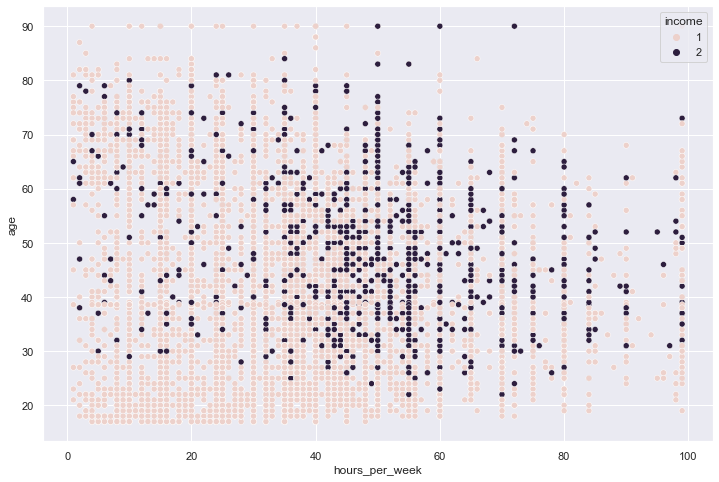

              precision    recall  f1-score   support

           1       0.78      0.98      0.87      5026
           2       0.50      0.07      0.12      1487

    accuracy                           0.77      6513
   macro avg       0.64      0.53      0.50      6513
weighted avg       0.72      0.77      0.70      6513



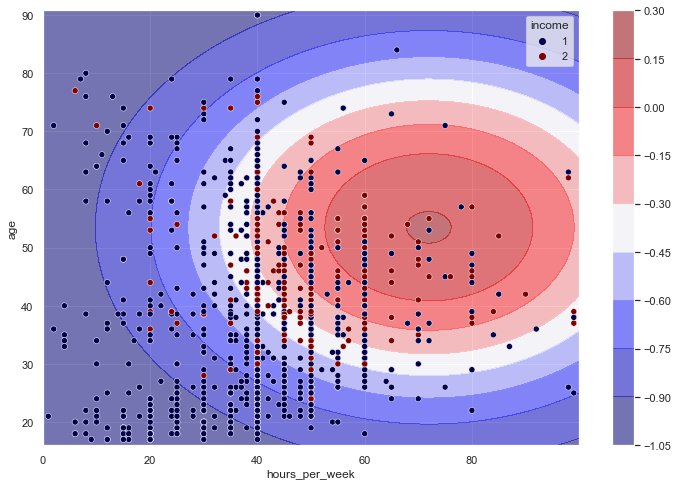

In [56]:
y = df['income']
X = df[['hours_per_week','age']].copy()
bayes_plot(pd.concat([X,y],axis=1),spread = 20)

### Decision tree

In [57]:
!conda install -y python-graphviz

Solving environment: ...working... done

# All requested packages already installed.



In [64]:
from io import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
from sklearn.tree import DecisionTreeClassifier
from sklearn.inspection import permutation_importance

In [69]:
def show_decision_tree_report_and_pie(X, y,depth=None):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=1)  # 80% training and 20% test
    clf = DecisionTreeClassifier()
    clf.fit(X_train,y_train)

    result = permutation_importance(clf,X,y,n_repeats=10,random_state=0)
    importance = zip(result['importances_mean'], X.columns)

    features = []
    values = []
    print('Features Importance:')
    for v,i in sorted(importance, reverse=True): # descending order
        features.append(i)
        values.append(v)
        print(f'Feature: %s scores: %.5f' % (i,v))


    # pie chart
    pie = plt.pie(values, labels=features, autopct='%1.1f%%', startangle=90, normalize=True)
    plt.rcParams['figure.figsize'] = [15, 12]
    plt.show()

    y_pred = clf.predict(X_test)
    print(metrics.classification_report(y_test, y_pred))
    return clf, X

def display_trained_tree_with_performance(X, y, depth=None):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=1)  # 70% training and 30% test
    clf = DecisionTreeClassifier(max_depth=depth)
    clf.fit(X_train,y_train)

    result = permutation_importance(clf, X, y, n_repeats=10,random_state=0)
    importance = zip(X.columns,result['importances_mean'])
    # summarize feature importance
    for i,v in importance:
        print('Feature: %s, Score: %.5f' % (i,v))

    # plot feature importance
    print(len(X.columns),[x[1] for x in importance])
    plt.bar(range(len(X.columns)), result['importances_mean'])
    plt.xticks(ticks=range(len(X.columns)),labels=X.columns, rotation=90)
    plt.show()

    y_pred = clf.predict(X_test)

    print(metrics.classification_report(y_test, y_pred))
    return clf, X

a. Baseline Decision Tree
Baseline Decision Tree classification report for the dataset, trained using the original data while dropping NA values

Features Importance:
Feature: age scores: 0.20522
Feature: fnlwgt scores: 0.18476
Feature: hours-per-week scores: 0.15021
Feature: capital-gain scores: 0.06807
Feature: capital-loss scores: 0.03409
              precision    recall  f1-score   support

       <=50K       0.82      0.81      0.82      2178
        >50K       0.46      0.48      0.47       729

    accuracy                           0.73      2907
   macro avg       0.64      0.65      0.65      2907
weighted avg       0.73      0.73      0.73      2907



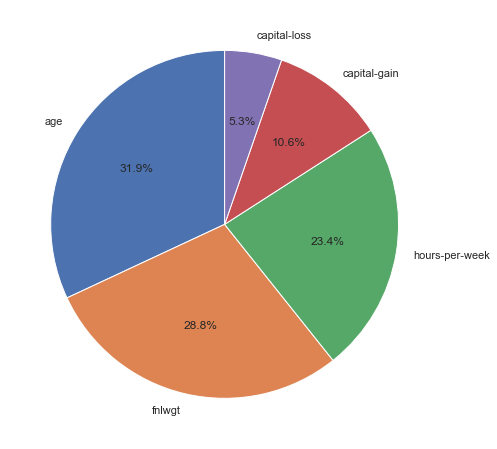

In [60]:
original_df = pd.read_csv('income1.csv',index_col="Index")
original_df.dropna(inplace=True)
categorical_to_drop = ['workclass','education','marital-status','occupation','relationship','race','sex','native-country','income']
original_X = original_df.drop(categorical_to_drop,axis=1)
original_y = original_df['income']

clf, X = show_decision_tree_report_and_pie(original_X, original_y)

b. Decision Tree Classifier based on manipulated data set

- Select the most relevant features.
- Final decision tree classification report and model visualization.
- Is there any improvement in the performance

Features Importance:
Feature: age scores: 0.20696
Feature: fnlwgt scores: 0.18686
Feature: hours_per_week scores: 0.14816
Feature: capital_diff scores: 0.07310
Feature: capital_gain scores: 0.05781
Feature: sex_ Male scores: 0.04633
Feature: capital_loss scores: 0.03401
Feature: sex_ Female scores: 0.02651
              precision    recall  f1-score   support

       <=50K       0.85      0.83      0.84      5026
        >50K       0.46      0.49      0.48      1487

    accuracy                           0.75      6513
   macro avg       0.65      0.66      0.66      6513
weighted avg       0.76      0.75      0.76      6513



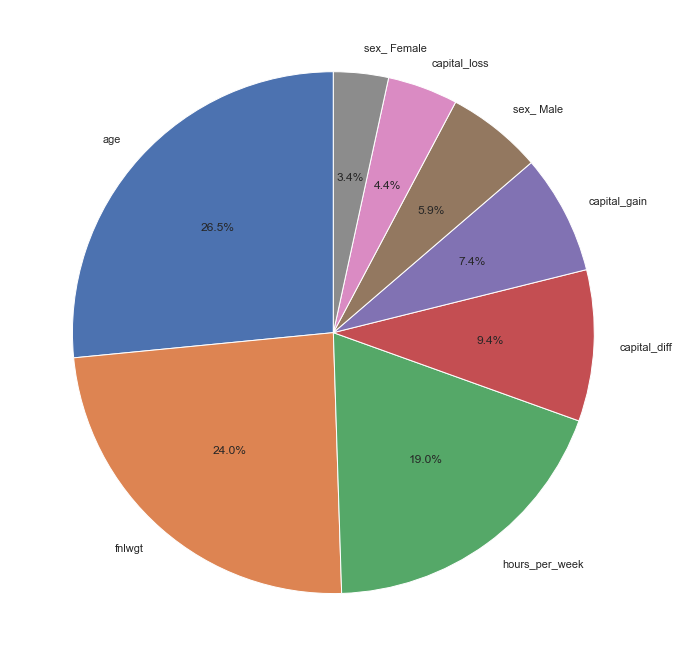

In [61]:
clean_df = pd.read_csv("clear_df.csv")
clear_y = clean_df['income']
categorical_to_drop = ['workclass','education','marital_status','occupation','relationship','race','sex','native_country','income']
clear_X = clean_df.drop(categorical_to_drop,axis=1)

clf, X = show_decision_tree_report_and_pie(clear_X, clear_y)

**We can see an improvement in the model accuracy from 0.73 to 0.75**

We take the four most important columns to build a tree

Features Importance:
Feature: age scores: 0.20606
Feature: fnlwgt scores: 0.18622
Feature: hours_per_week scores: 0.14787
Feature: capital_diff scores: 0.09674
Feature: sex_ Female scores: 0.04776
Feature: capital_loss scores: 0.03556
Feature: sex_ Male scores: 0.02534
Feature: capital_gain scores: 0.02113
              precision    recall  f1-score   support

       <=50K       0.85      0.83      0.84      5026
        >50K       0.46      0.49      0.47      1487

    accuracy                           0.75      6513
   macro avg       0.65      0.66      0.66      6513
weighted avg       0.76      0.75      0.75      6513

Feature: age, Score: 0.00429
Feature: fnlwgt, Score: 0.00000
Feature: capital_gain, Score: 0.04145
Feature: capital_loss, Score: 0.01993
Feature: hours_per_week, Score: 0.00011
Feature: sex_ Female, Score: 0.00000
Feature: sex_ Male, Score: 0.00000
Feature: capital_diff, Score: 0.03280
8 []
              precision    recall  f1-score   support

       <=50K      

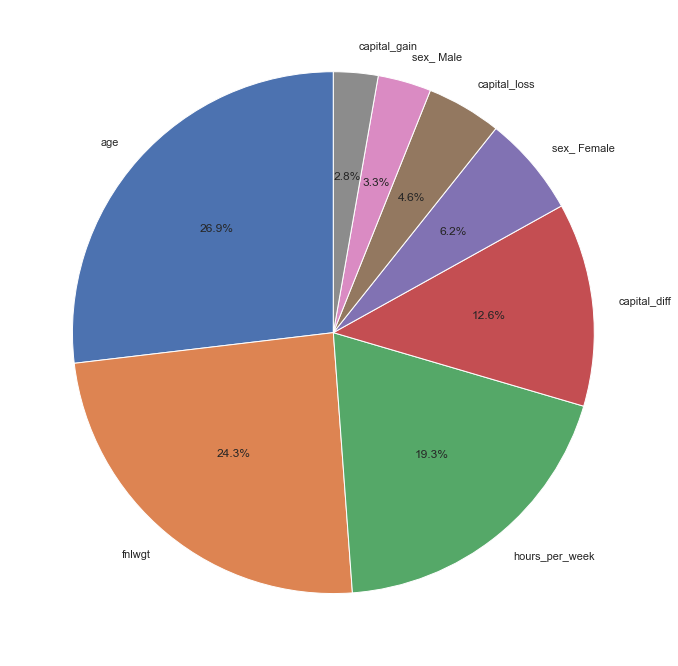

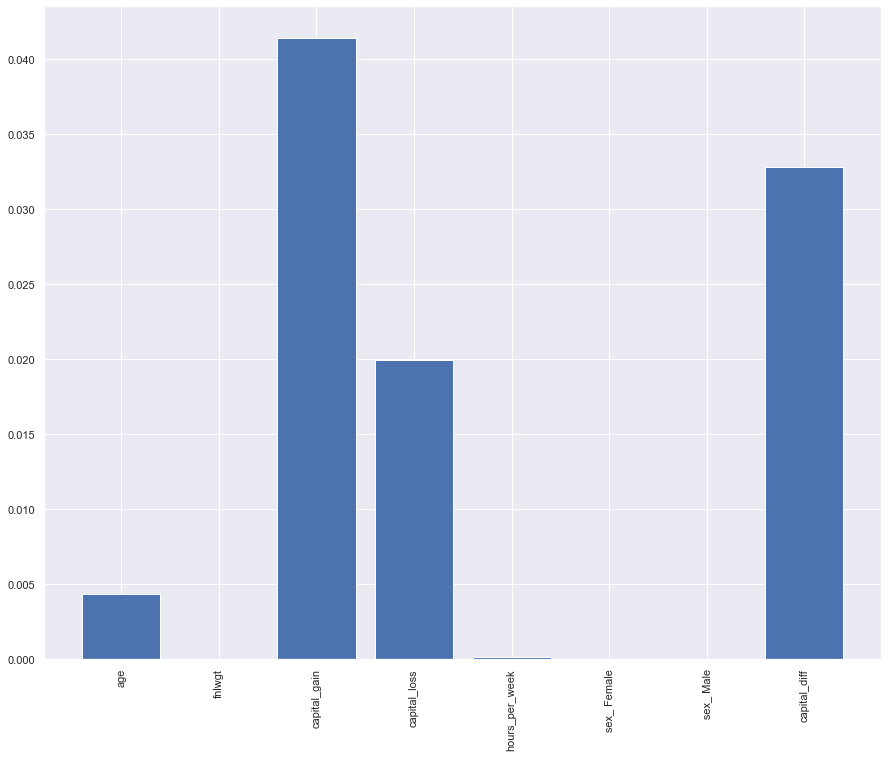

In [70]:
_X = df[['age', 'fnlwgt', 'hours_per_week','capital_diff']]
clf, X = show_decision_tree_report_and_pie(clear_X, clear_y)
clfDepthFour, XDepthFour = display_trained_tree_with_performance(clear_X, clear_y, depth=4)

In [67]:
def render_tree(clf, X, file_name, depth=None):
    dot_data=StringIO()
    export_graphviz(clf,out_file=dot_data,filled=True,rounded=True,feature_names=X.columns,class_names=clf.classes_)
    graph=pydotplus.graph_from_dot_data(dot_data.getvalue())
    graph.write_png('{}.png'.format(file_name))
    return Image(graph.create_png())

render_tree(clf, X, file_name="ManipulatedDecisionTree")

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.167792 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.167792 to fit



Let's try to limit the tree's depth to 4

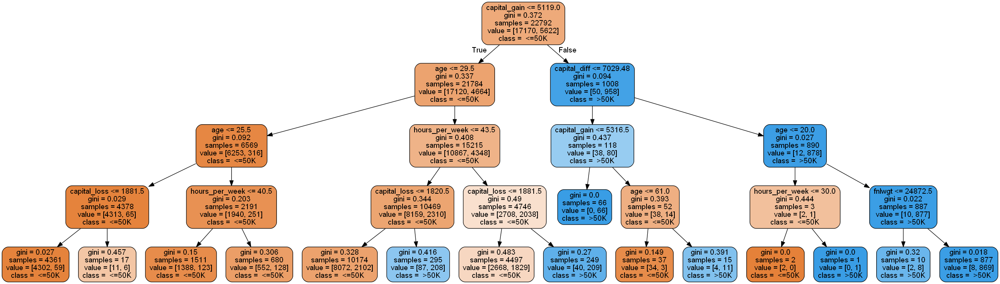

In [71]:
render_tree(clfDepthFour, XDepthFour, file_name="ManipulatedDecisionTreeDepthFour")

## Summery

**After cleaning, analyzing, and plotting the data, here are some insights I found:**

- Only about 1/3 of the population at the time would be considered high income while 2/3 of the population were making less than 50,000 USD per year.
- Capital Gain was a good indicator of wealth with a pretty clear separation of people making higher than 50k with higher capital gain which is an indicator of the wealth gap in the US starting to grow.
- Capital Loss was a mixture of both high income and low income individuals and not a clear indicator of wealth.
- Education was a pretty good indicator of income with the highest percentage of high income individuals finishing a PHD, Masters, or Bachelor's degree. The majority of the population had either a high school degree and / or some college finished.
Married people had the highest percentage of high income people with husbands making up the majority of the workforce.
- The male working market more than doubled the female working market.
- The male dominant job was Craft-repair whereas the female dominant job was Adm-clerical.
- Our correlation matrices show lots of correlation as well as co-correlation between fields. We had to remove certain fields to prevent co-correlation.